<a href="https://colab.research.google.com/github/Kairos1708/Se-ales_y_Sistemas/blob/main/Taller_Transformada_Z.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Transformada Z - Cuaderno 5 - Ejercicios** \\
***Juan Esteban Montes Salazar - 1193524007*** \\
***Señales y Sistemas - Andrés Marino Alvárez***

In [3]:
# LIBRERÍAS

import soundfile as sf
import scipy
import numpy as np


from scipy.signal import butter
from scipy.signal import cheby1
from scipy.signal import cheby2
from scipy.signal import bessel
from scipy.signal import ellip
from scipy.signal import firwin
from scipy.signal import lfilter, filtfilt
from scipy.signal import freqz_zpk
from IPython.display import Markdown as md
from IPython.display import Audio
from matplotlib import pyplot as plt
from matplotlib.patches import Circle

In [4]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 11.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 44.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.5/162.5 kB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.6/104.6 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 109.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.1/142.1 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.5/61.5 kB 7.8 MB/s eta 0:00:00
  Created 

In [5]:
# Realizamos un programa para comenzar a descargar la canción dónde se leerá el link y el nombre de esta

import os
import yt_dlp as youtube_dl
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

In [6]:
link_= ["https://www.youtube.com/watch?v=mN_UkDluO6M"]
name_ = ['Muy demalas - Darío Gómez'
        ]
for name,link in zip(name_,link_):
    print(name)
    download_ytvid_as_mp3(link,name)

Muy demalas - Darío Gómez
[youtube] Extracting URL: https://www.youtube.com/watch?v=mN_UkDluO6M
[youtube] mN_UkDluO6M: Downloading webpage
[youtube] mN_UkDluO6M: Downloading ios player API JSON
[youtube] mN_UkDluO6M: Downloading android player API JSON
[youtube] mN_UkDluO6M: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=mN_UkDluO6M
[youtube] mN_UkDluO6M: Downloading webpage
[youtube] mN_UkDluO6M: Downloading ios player API JSON
[youtube] mN_UkDluO6M: Downloading android player API JSON
[youtube] mN_UkDluO6M: Downloading m3u8 information
[info] mN_UkDluO6M: Downloading 1 format(s): 251
[download] Destination: Muy demalas - Darío Gómez.mp3
[download] 100% of    3.22MiB in 00:00:00 at 15.83MiB/s  
Download complete... Muy demalas - Darío Gómez.mp3


In [7]:
# Instalamos la extensión soundfile
!pip install soundfile

In [8]:
import subprocess

for name in name_:
    subprocess.call(['ffmpeg','-y', '-i', name+'.mp3',
                   name+'.wav'])

In [10]:
import soundfile as sf # para instalar pip install soundfile
for name in name_:
    nombre_out = "output.wav"
    x, fs = sf.read(name+'.wav')

    print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,name+'.wav'))

print('Frecuencia de muestreo %.2f[Hz]' %(fs))
xpro = x.copy()


inicial = int(input("Ingrese el tiempo inicial de la canción"))
final =  int(input("Ingrese el tiempo inicial de la canción"))

corte1 = int(input("Ingrese la frecuencia de corte inferior para el filtro pasa bandas"))
corte2 = int(input("Ingrese la frecuencia de corte superior para el filtro pasa bandas"))

ti = inicial
tf = final
xs = xpro[int(ti*fs):int((tf*fs)),:]
K= int(len(xs)/2) + 1
print(f'Audio original:')
Audio([xs[:,1], xs[:,0]],rate=fs) #segmento de audio

Frecuencia de muestreo 48000.00[Hz]
audio Muy demalas - Darío Gómez.wav
Frecuencia de muestreo 48000.00[Hz]
Ingrese el tiempo inicial de la canción60
Ingrese el tiempo inicial de la canción70
Ingrese la frecuencia de corte inferior para el filtro pasa bandas1000
Ingrese la frecuencia de corte superior para el filtro pasa bandas4500
Audio original:


In [13]:
#Filtro Butterworth
print("Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones")
print("Filtrado paso bajo: lowpass",
      "Filtrado paso alto: highpass",
      "Filtrado pasa banda: bandpass"
      "Filtrado rechaza banda: bandstop")

filtrado = str(input("Ingrese el nombre del tipo de filtrado tal como se indica en la tabla"))
N_orden= int(input("Ingrese el orden del filtro"))

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = butter(N_orden, Wn=wn, btype=filtrado, output='ba',fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
Filtrado paso bajo: lowpass Filtrado paso alto: highpass Filtrado pasa banda: bandpassFiltrado rechaza banda: bandstop
Ingrese el nombre del tipo de filtrado tal como se indica en la tablabandpass
Ingrese el orden del filtro1
Audio filtrado


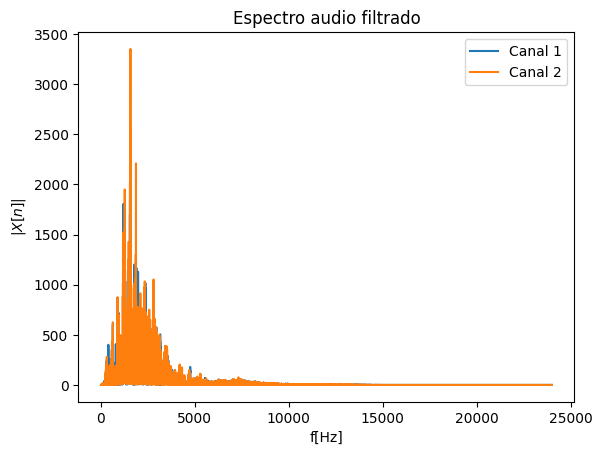

In [14]:
#Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0) # fft por cada columna de xpro
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [17]:
# Filtro Chebyshev I
print("Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones")
print("Filtrado paso bajo: lowpass",
      "Filtrado paso alto: highpass",
      "Filtrado pasa banda: bandpass"
      "Filtrado rechaza banda: bandstop")

filtrado = str(input("Ingrese el nombre del tipo de filtrado tal como se indica en la tabla"))
N_orden = int(input("Ingrese el orden del filtro"))
ripple = int(input("Ingrese el orden del filtro"))

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den=cheby1(N_orden, rp=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
Filtrado paso bajo: lowpass Filtrado paso alto: highpass Filtrado pasa banda: bandpassFiltrado rechaza banda: bandstop
Ingrese el nombre del tipo de filtrado tal como se indica en la tablalowpass
Ingrese el orden del filtro2
Ingrese el orden del filtro5
Audio filtrado


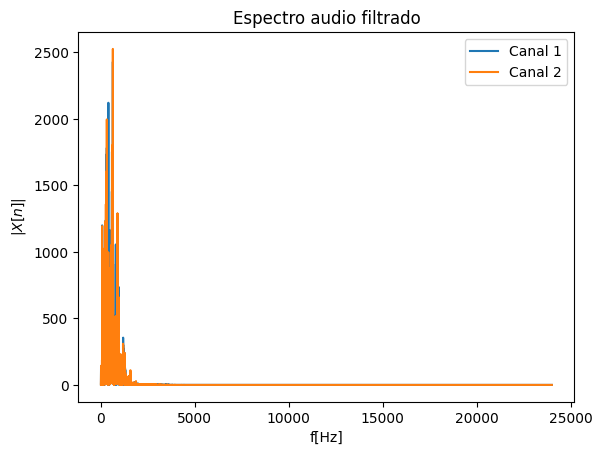

In [18]:
#Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [19]:
#Filtro Chebyshev II
print("Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones")
print("Filtrado paso bajo: lowpass",
      "Filtrado paso alto: highpass",
      "Filtrado pasa banda: bandpass"
      "Filtrado rechaza banda: bandstop")

filtrado = str(input("Ingrese el nombre del tipo de filtrado tal como se indica en la tabla"))
N_orden = int(input("Ingrese el orden del filtro"))
ripple = int(input("Ingrese el orden del filtro"))

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = cheby2(N_orden, rs=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
Filtrado paso bajo: lowpass Filtrado paso alto: highpass Filtrado pasa banda: bandpassFiltrado rechaza banda: bandstop
Ingrese el nombre del tipo de filtrado tal como se indica en la tablahighpass
Ingrese el orden del filtro5
Ingrese el orden del filtro2
Audio filtrado


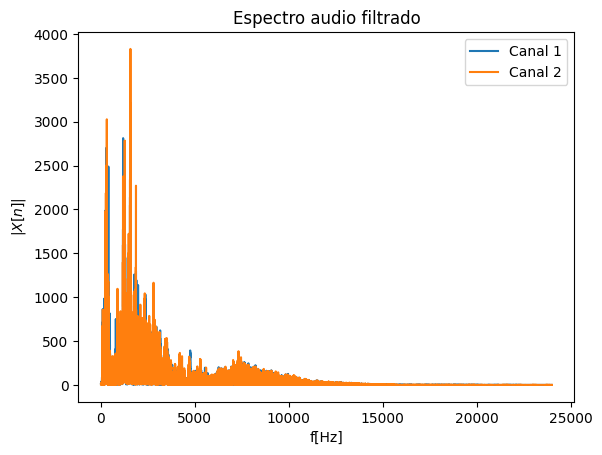

In [20]:
#Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [22]:
#Filtro Bessel
print("Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones")
print("Filtrado paso bajo: lowpass",
      "Filtrado paso alto: highpass",
      "Filtrado pasa banda: bandpass"
      "Filtrado rechaza banda: bandstop")

filtrado = str(input("Ingrese el nombre del tipo de filtrado tal como se indica en la tabla"))
N_orden = int(input("Ingrese el orden del filtro"))
normali="mag"

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
if filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den = bessel(N_orden, wn, btype=filtrado, output='ba', norm = normali, fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado:')
Audio([xf[:,1], xf[:,0]],rate=fs)

Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
Filtrado paso bajo: lowpass Filtrado paso alto: highpass Filtrado pasa banda: bandpassFiltrado rechaza banda: bandstop
Ingrese el nombre del tipo de filtrado tal como se indica en la tablabandpass
Ingrese el orden del filtro4
Audio filtrado:


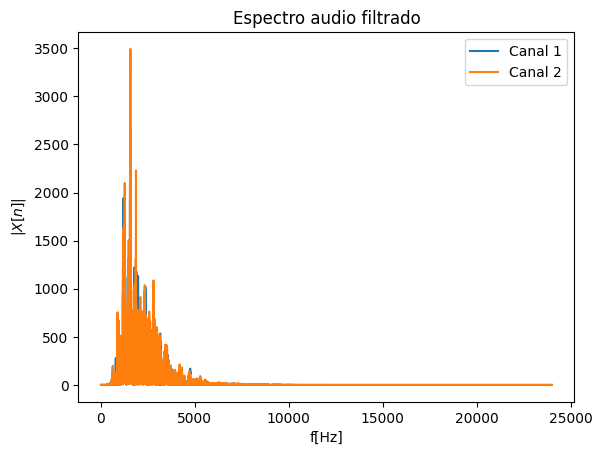

In [23]:
#Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [25]:
#Filtro Elíptico
print("Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones")
print("Filtrado paso bajo: lowpass",
      "Filtrado paso alto: highpass",
      "Filtrado pasa banda: bandpass"
      "Filtrado rechaza banda: bandstop")

filtrado = str(input("Ingrese el nombre del tipo de filtrado tal como se indica en la tabla"))
N_orden = int(input("Ingrese el orden del filtro"))
ripple_pass = int(input("Ingrese el orden del filtro ripple de paso"))
ripple_stop = int(input("Ingrese el orden del filtro ripple de parada"))

print("Para 'riple_pass y stop' la entrada deben ser en db")

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den=ellip(N_orden, rp=ripple_pass, rs=ripple_stop, Wn=wn, btype=filtrado, fs=fs)

xf=filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
Filtrado paso bajo: lowpass Filtrado paso alto: highpass Filtrado pasa banda: bandpassFiltrado rechaza banda: bandstop
Ingrese el nombre del tipo de filtrado tal como se indica en la tablahighpass
Ingrese el orden del filtro2
Ingrese el orden del filtro ripple de paso9
Ingrese el orden del filtro ripple de parada15
Para 'riple_pass y stop' la entrada deben ser en db
Audio filtrado


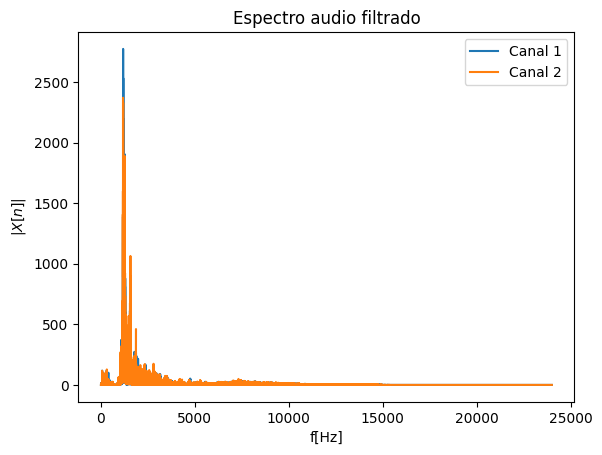

In [26]:
# Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

Ingrese el orden del filtro45


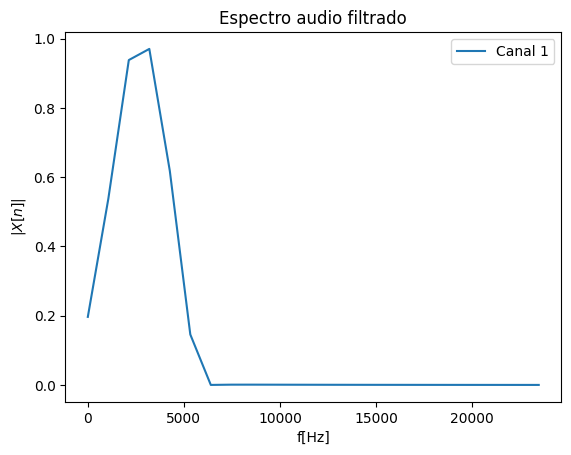

In [27]:
#Filtro Firwin Pasa banda



N_orden = int(input("Ingrese el orden del filtro"))

coeff_fir=firwin(N_orden, [corte1, corte2], pass_zero=False, fs=fs)

xpro=coeff_fir.copy()
Xw=np.fft.rfft(coeff_fir,axis=0)
vf=np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

